In [1]:
# intermediate save
import torch
from diffusers import StableDiffusionInpaintPipeline, UNet2DConditionModel

model_path = "/data/noah/ckpt/pretrain_ckpt/StableDiffusion/inpaint"
unet_path = "/data/noah/ckpt/finetuning/SD_INPAINT_human/checkpoint-18000"
out_path = "/data/noah/ckpt/finetuning/SD_INPAINT_human"

pipeline = StableDiffusionInpaintPipeline.from_pretrained(model_path, torch_dtype=torch.float16).to("cuda:1")

pipeline.unet = UNet2DConditionModel.from_pretrained(
    unet_path,
    subfolder="unet",
    revision=None,
)

pipeline.save_pretrained(out_path)

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["bos_token_id"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["eos_token_id"]` will be overriden.


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion_inpaint.StableDiffusionInpaintPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


  0%|          | 0/10 [00:00<?, ?it/s]

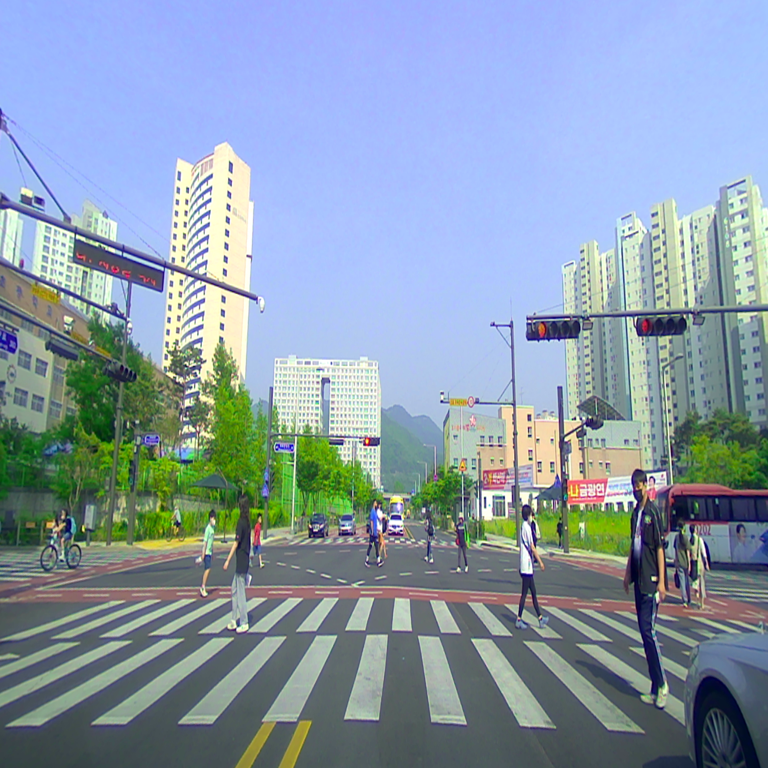

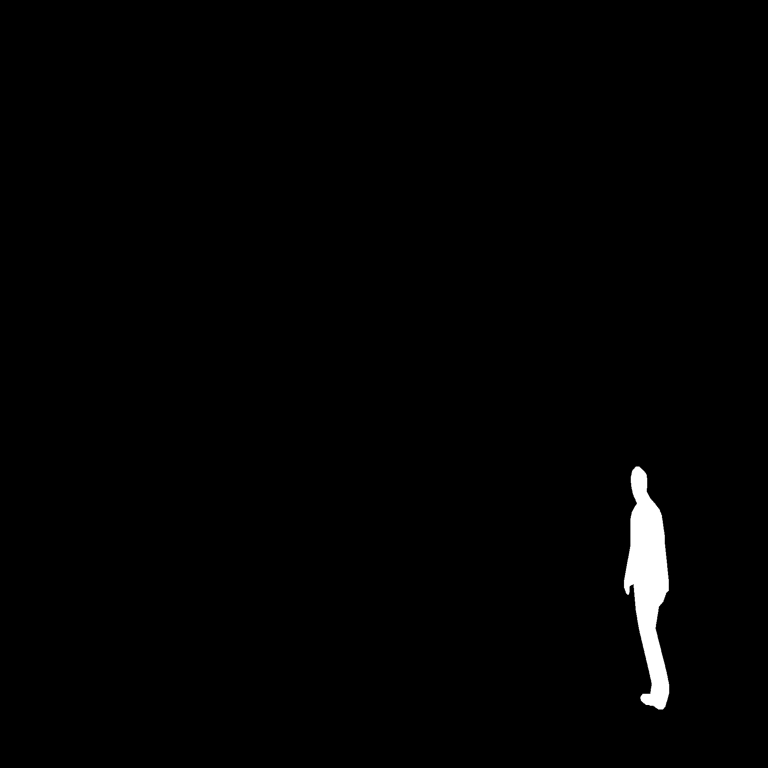

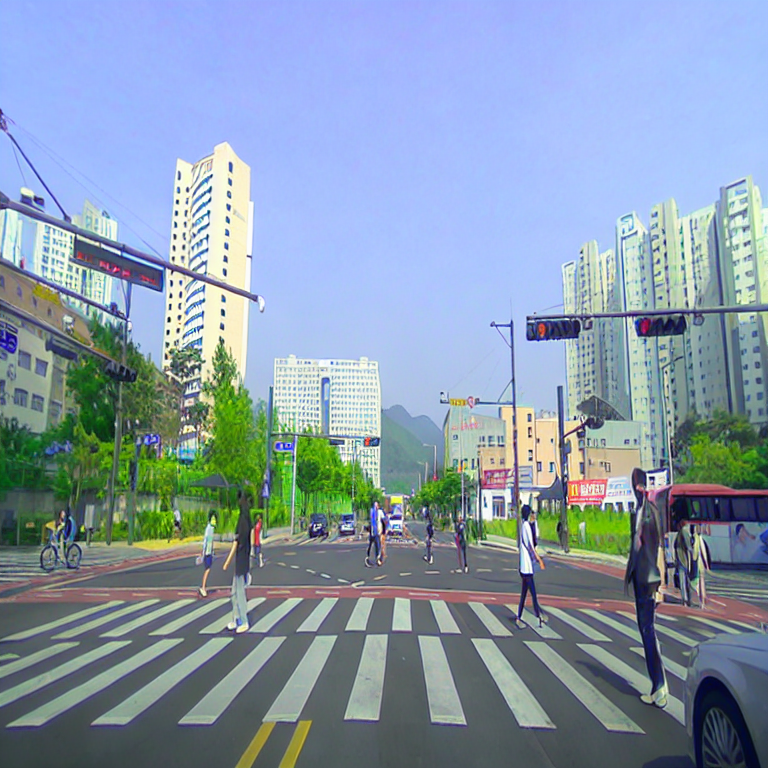

: 

In [7]:
import cv2
import os
import torch
from PIL import Image
import json
import numpy as np
from diffusers import StableDiffusionInpaintPipeline

device = "cuda:1"

model_path = "/data/noah/ckpt/finetuning/SD_INPAINT_human"
pipeline = StableDiffusionInpaintPipeline.from_pretrained(
    model_path, safety_checker=None, torch_dtype=torch.float16
).to(device)

generator = torch.Generator(device=device).manual_seed(42)

anno_path = "/data/noah/dataset/ad_human/anno/1653288140301_FR-View-CMR-Wide.json"

with open(anno_path, "r") as f:
    annotation = json.load(f)

image_path = os.path.join(annotation["parent_path"], annotation["filename"])
image = Image.open(image_path).convert("RGB")
prompt = "pedestrian"

target_idxs = []
for idx, ann in enumerate(annotation["annotations"]):
    if ann["label"] == prompt:
        target_idxs.append(idx)

target_idxs = [target_idxs[1]]

mask = np.zeros((image.height, image.width))

for target_idx in target_idxs:
    points = np.array(annotation["annotations"][target_idx]["points"], dtype=np.int32)
    try:
        mask = cv2.fillPoly(mask, [points], color=255)
    except:
        continue

if not mask.any():
    print("error")

mask = Image.fromarray(mask.astype(np.uint8), mode="L").resize((768, 768))
image = image.resize((768, 768))

result = pipeline(prompt=prompt, image=image, mask_image=mask, generator=generator, height=768, width=768).images[0]

display(image)
display(mask)
display(result)

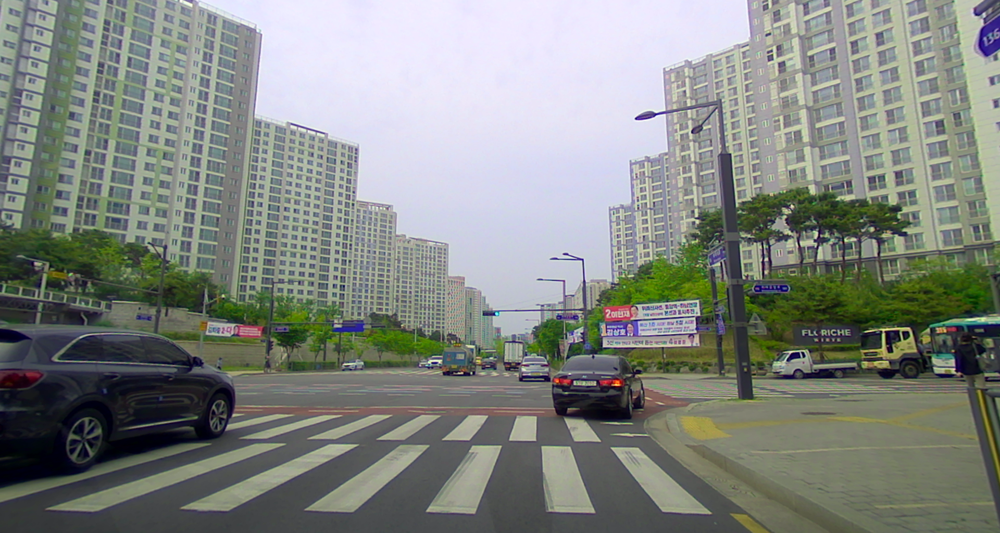

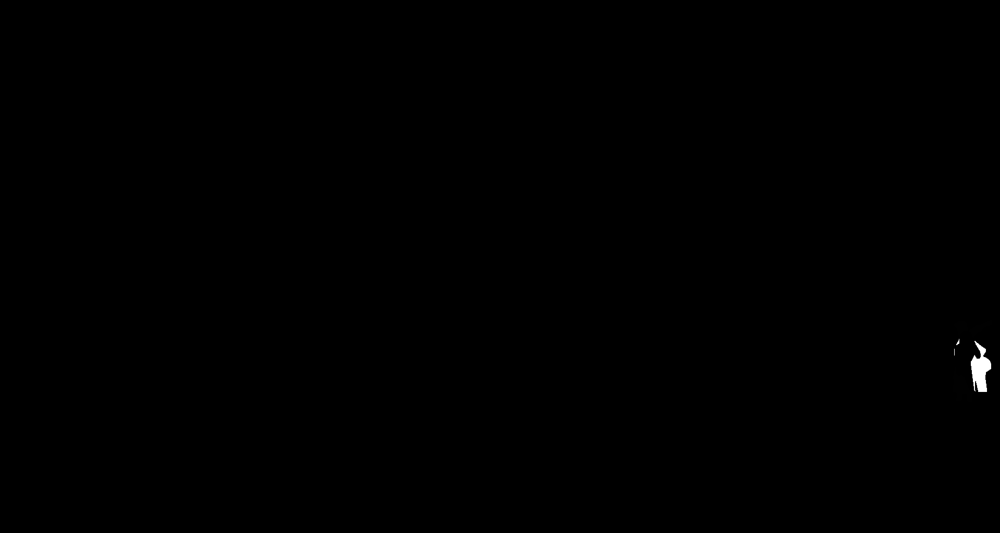

In [37]:
import cv2
import os
import torch
from PIL import Image
import json
import numpy as np

def gen_inner_image(target_mask, target_image, center_x, center_y, height, width):
    inner_image = np.ones((height, width, 3))*255
    index = np.where(target_mask==255)
    
    left = int(center_x - target_mask.shape[1]/2)
    top = int(center_y - target_mask.shape[0]/2)

    # print(index) #[array(), array()]
    
    for y, x in zip(index[0], index[1]):
        inner_image[top+y,left+x,:] = target_image[y,x,:]
    
    return inner_image

def add_mask(mask, new_mask, center_x, center_y):
    # 새로운 마스크를 더할 위치 계산
    new_mask_height, new_mask_width = new_mask.shape[0], new_mask.shape[1]
    left = int(center_x - new_mask_width/2)
    right = int(center_x + new_mask_width/2)
    top = int(center_y - new_mask_height/2)
    bottom = int(center_y + new_mask_height/2)
    
    if left<0 or right>mask.shape[1] or top<0 or bottom>mask.shape[0]:
        return None
    
    mask[top:bottom, left:right] -= new_mask
    mask[mask<0] = 0
    return mask

def crop_from_mask(mask):
    # Find contours in the mask
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # If no contours found, return original image
    if not contours:
        return None

    # Find the bounding box of the largest contour
    x, y, w, h = cv2.boundingRect(contours[0])

    return x, y, w, h

annotation_path = '/data/noah/dataset/ad_human/anno/1652939427539_FR-View-CMR-Wide.json'
target_image_path = '/data/noah/inference/magna/images/1.png'
target_mask_path = '/data/noah/inference/magna/masks/1.png'
class_name = "pedestrian"

with open(annotation_path, 'r') as f:
    annotation = json.load(f)

image_path = os.path.join(annotation["parent_path"], annotation["filename"])
image = Image.open(image_path).convert('RGB')

mask = np.zeros((image.height, image.width))
target_idxs = []
for idx, ann in enumerate(annotation["annotations"]):
    if ann["label"] == class_name:
        target_idxs.append(idx)
target_idxs = [target_idxs[0]]

for target_idx in target_idxs:
    points = np.array(annotation["annotations"][target_idx]["points"], dtype=np.int32)
    try:
        mask = cv2.fillPoly(mask, [points], color=255)
    except:
        continue

if not mask.any():
    print("error")

mask = mask.astype(np.uint8)

display(image)
# display(Image.fromarray(mask))

target_image = Image.open(target_image_path).convert('RGB')
target_mask = Image.open(target_mask_path)

# display(target_image)
# display(target_mask)

target_image = np.array(target_image)
target_mask = np.array(target_mask)

x,y,w,h = crop_from_mask(mask) #left/top
center_x, center_y = int(x+float(w)/2), int(y+float(h)/2)
# print(center_x)
# print(center_y)

mask = add_mask(mask, target_mask, center_x, center_y).astype(np.uint8)
mask = Image.fromarray(mask)

display(mask)
inner_image = gen_inner_image(target_mask, target_image, center_x, center_y, image.height, image.width).astype(np.uint8)
inner_image = Image.fromarray(inner_image).convert('RGB').convert('RGBA')
# display(inner_image)


/opt/conda/lib/python3.10/site-packages/huggingface_hub/file_download.py:655: FutureWarning: 'cached_download' is the legacy way to download files from the HF hub, please consider upgrading to 'hf_hub_download'
  warnings.warn(
Keyword arguments {'safety_cheker': None} are not expected by ImageToImageInpaintingPipeline and will be ignored.


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["bos_token_id"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["eos_token_id"]` will be overriden.


  0%|          | 0/50 [00:00<?, ?it/s]

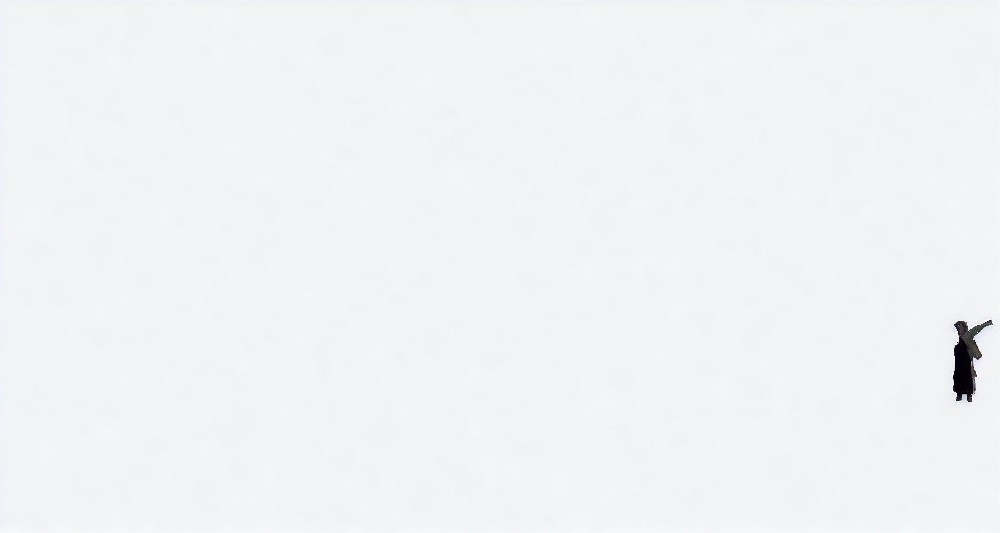

In [35]:
import cv2
import os
import torch
from PIL import Image
import json
import numpy as np
from diffusers import DiffusionPipeline

device = "cuda:2"

model_path = "/data/noah/ckpt/pretrain_ckpt/StableDiffusion/inpaint"
pipeline = DiffusionPipeline.from_pretrained(model_path, safety_cheker=None, torch_dtype=torch.float16, custom_pipeline="img2img_inpainting").to(device)
generator = torch.Generator(device=device).manual_seed(42)

result = pipeline(prompt=class_name, inner_image = inner_image, image=image, mask_image=mask, generator=generator, height=image.height, width=image.width).images[0]
display(result)

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion_inpaint.StableDiffusionInpaintPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


  0%|          | 0/50 [00:00<?, ?it/s]

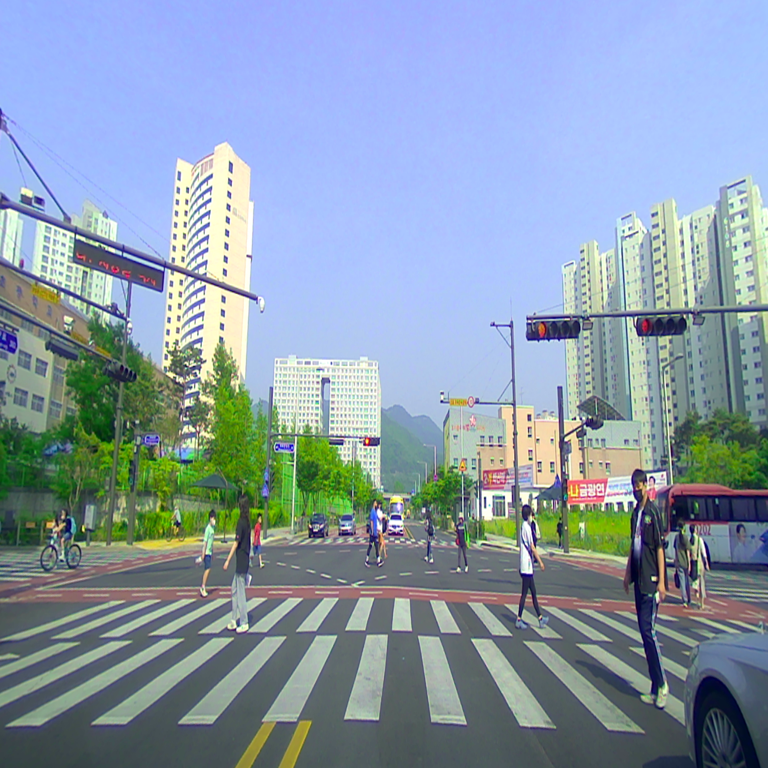

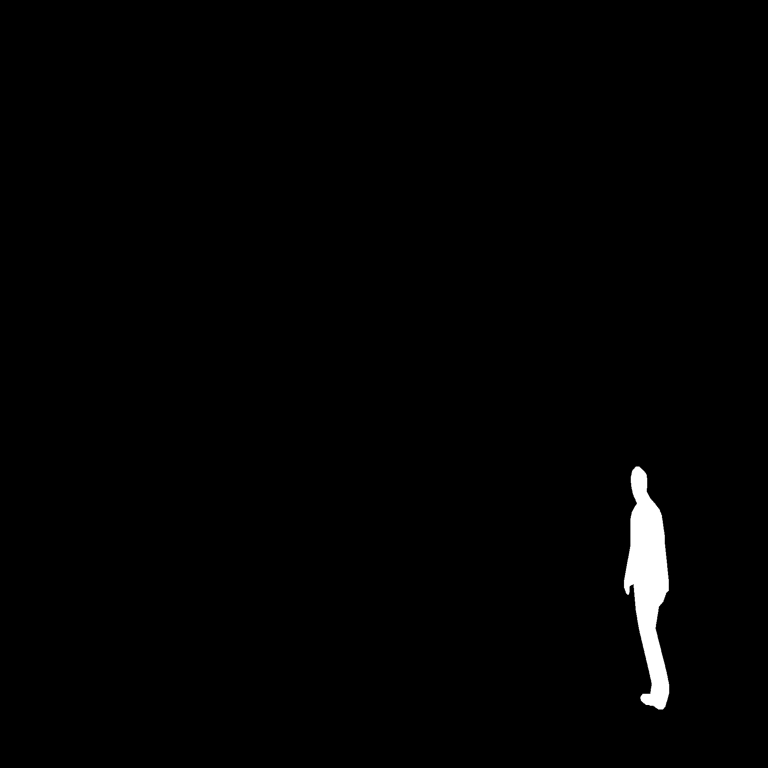

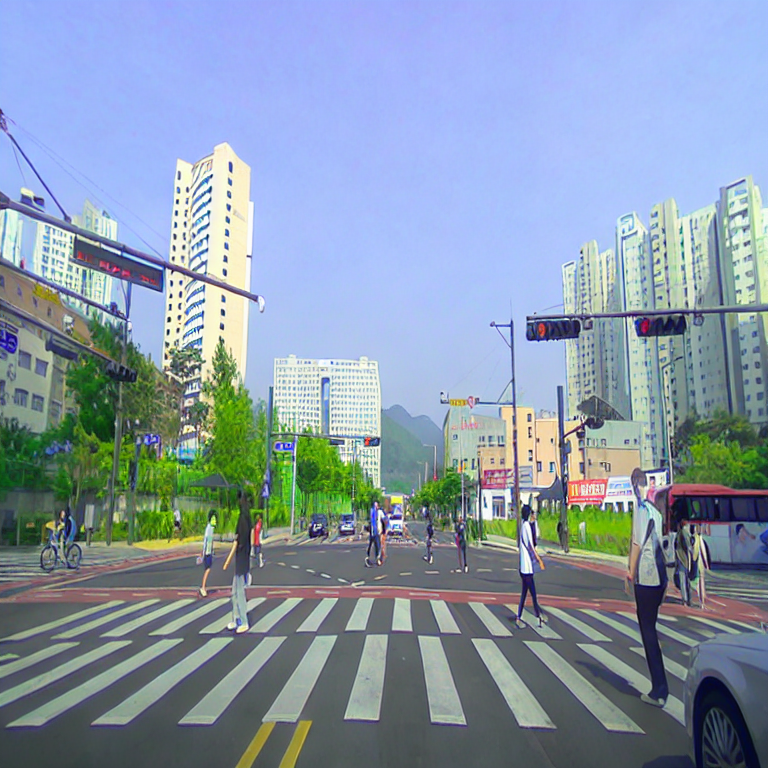

In [28]:
import cv2
import os
import torch
from PIL import Image
import json
import numpy as np
from diffusers import StableDiffusionInpaintPipeline

device = "cuda:1"

model_path = "/data/noah/ckpt/finetuning/SD_INPAINT_human"
pipeline = StableDiffusionInpaintPipeline.from_pretrained(
    model_path, safety_checker=None, torch_dtype=torch.float16
).to(device)

generator = torch.Generator(device=device).manual_seed(42)

anno_path = "/data/noah/dataset/ad_human/anno/1653288140301_FR-View-CMR-Wide.json"

with open(anno_path, "r") as f:
    annotation = json.load(f)

image_path = os.path.join(annotation["parent_path"], annotation["filename"])
image = Image.open(image_path).convert("RGB")
prompt = "pedestrian"

target_idxs = []
for idx, ann in enumerate(annotation["annotations"]):
    if ann["label"] == prompt:
        target_idxs.append(idx)

target_idxs = [target_idxs[1]]

mask = np.zeros((image.height, image.width))

for target_idx in target_idxs:
    points = np.array(annotation["annotations"][target_idx]["points"], dtype=np.int32)
    try:
        mask = cv2.fillPoly(mask, [points], color=255)
    except:
        continue

if not mask.any():
    print("error")

mask = Image.fromarray(mask.astype(np.uint8), mode="L").resize((768, 768))
image = image.resize((768, 768))

result = pipeline(prompt=prompt, image=image, mask_image=mask, generator=generator, height=768, width=768).images[0]

display(image)
display(mask)
display(result)